In [35]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D
import contextily as ctx
import xyzservices.providers as xyz
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
test_wesm = gpd.read_parquet("/home/jehayes/gda_final/ATL06_LaserLottery/data/wesm/OR_McKenzieRiver_1_2021_3870_count_543_med.parquet")
test_atl06 = gpd.read_parquet("/home/jehayes/gda_final/ATL06_LaserLottery/data/atl06_default/OR_McKenzieRiver_1_2021_default_3870_count_543_med.parquet")

In [8]:
test_wesm.crs==test_atl06.crs

True

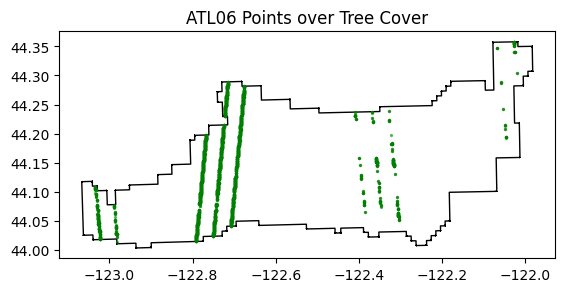

In [9]:
f, ax = plt.subplots()
test_wesm.plot(ax=ax, facecolor="none", edgecolor='black')
test_atl06.plot(ax=ax, color='green', markersize=2, alpha=0.5)
plt.title('ATL06 Points over Tree Cover');

In [ ]:
beam_strength = {
    10: 'weak',
    20: 'strong',
    30: 'weak',
    40: 'strong',
    50: 'weak',
    60: 'strong'
}

track_groups = test_atl06.groupby(["gt", "cycle", "region"])

data = []
for idx, (name, group) in enumerate(track_groups):
    gt, cycle, region = name
    strength = beam_strength[gt.item()]
    median_elev_diff = group.elev_diff.median()
    data.append((gt, cycle, region, strength, median_elev_diff))

df = pd.DataFrame(data, columns=["gt", "cycle", "region", "beam_strength", "median_elev_diff"])

In [27]:
test_wesm

,workunit,workunit_id,project,project_id,start_datetime,end_datetime,ql,spec,p_method,dem_gsd_meters,...,geometry,collection,datetime,dayofyear,duration,mean_diff,med_diff,std_diff,nmad_diff,n_points
0,OR_McKenzieRiver_1_2021,220421,OR_McKenzieRiver_2021_B21,220424,2021-07-04,2021-07-06,QL 1,USGS Lidar Base Specification 2.1,linear-mode lidar,0.4572,...,"MULTIPOLYGON (((-122.93477 44.00285, -122.9347...",3DEP,2021-07-05,186,2,9.118077,5.433482,10.336917,8.276303,3870.0


In [23]:
df.sort_values(by="median_elev_diff", key=abs, ascending=False)

,gt,cycle,region,beam_strength,median_elev_diff
10,40,12,6,strong,12.012936
16,60,12,6,strong,9.982573
4,20,12,6,strong,8.274575
0,10,12,2,weak,-1.842926
6,30,12,2,weak,-0.297107
13,50,12,6,weak,0.218764
5,30,11,2,weak,0.198201
14,60,11,2,strong,0.140406
8,40,11,2,strong,0.101705
1,10,12,6,weak,-0.090098


/tmp/ipykernel_78874/1190924260.py:75: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


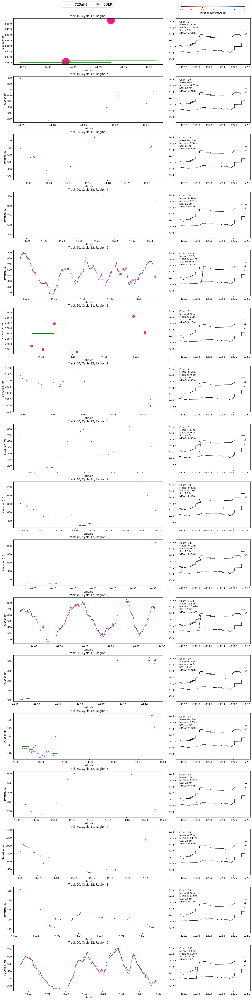

In [30]:
track_groups = test_atl06.groupby(["gt", "cycle", "region"])
n_groups = len(track_groups)

fig = plt.figure(figsize=(15, 4*n_groups))
gs = GridSpec(n_groups, 2, width_ratios=[2, 1])

# Create a colorbar axis above the right column
cbar_ax = fig.add_axes([.715, 0.86, 0.25, 0.001]) 
norm = plt.Normalize(vmin=-3, vmax=3)
sm = plt.cm.ScalarMappable(cmap='RdBu', norm=norm)
plt.colorbar(sm, cax=cbar_ax, orientation='horizontal', label='Elevation Difference (m)')

for idx, (name, group) in enumerate(track_groups):
    ax1 = fig.add_subplot(gs[idx, 0])
    
    meters_to_degrees_40m = 40 / 111000
    y_coords = [geom.y for geom in group.geometry]
    
    # Create horizontal lines for ICESat-2 elevations
    for lat, elev in zip(y_coords, group['h_mean']):
        ax1.hlines(y=elev, xmin=lat-meters_to_degrees_40m/2, xmax=lat+meters_to_degrees_40m/2,
                  colors='green', label='ICESat-2' if (idx==0 and lat==y_coords[0]) else "")
    
    # Calculate dynamic marker size based on x-axis range
    x_range = max(y_coords) - min(y_coords)
    marker_size = (meters_to_degrees_40m / x_range) * 500
    
    # Plot 3DEP points with dynamic sizing
    ax1.scatter(y_coords, group['3dep.value'],
               marker='o',
               c='deeppink',
               alpha=1.0,
               s=marker_size,
               label='3DEP' if idx==0 else "")
    
    ax1.set_xlabel('Latitude')
    ax1.set_ylabel('Elevation (m)')
    ax1.set_title(f'Track {name[0]}, Cycle {name[1]}, Region {name[2]}')
    
    # Format x-axis to show two decimal places
    ax1.xaxis.set_major_formatter(plt.FormatStrFormatter('%.2f'))

    # For the legend, we can control marker size specifically for the legend:
    if idx == 0:
        legend_elements = [
            Line2D([0], [0], color='green', label='ICESat-2'),
            Line2D([0], [0], marker='o', color='w', label='3DEP',
                markerfacecolor='deeppink', markersize=10)
        ]
        ax1.legend(handles=legend_elements, bbox_to_anchor=(0.5, 1.3), 
                loc='center', ncol=2, fontsize=14)

    
    # Enhanced map plot with elevation differences
    ax2 = fig.add_subplot(gs[idx, 1])
    test_wesm.plot(ax=ax2, facecolor="none", edgecolor='black')
    group.plot(ax=ax2, column='elev_diff', cmap='RdBu',
              vmin=-3, vmax=3, alpha=0.7, markersize=2)
    ax2.set_title('')
    mean_diff = round(group['elev_diff'].mean(), 2)
    median_diff = round(group['elev_diff'].median(), 2)
    std_diff = round(group['elev_diff'].std(), 2)
    nmad = round(1.4826 * np.median(np.abs(group['elev_diff'] - median_diff)), 2)
    count = len(group)

    # Add stats text
    stats_text = f'Count: {count}\nMean: {mean_diff}m\nMedian: {median_diff}m\nStd: {std_diff}m\nNMAD: {nmad}m'
    ax2.text(0.05, 0.95, stats_text, 
            transform=ax2.transAxes,
            fontsize=10,
            verticalalignment='top',
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))
    ax2.axis('equal')

plt.tight_layout()
# Adjust layout to accommodate the colorbar and legend
plt.subplots_adjust(top=0.85)

In [40]:
test_atl06.explore(column='elev_diff', cmap='RdBu',
                                            tiles = xyz.Esri.WorldImagery,
                                            vmin=-10, vmax=10)

slope variability 2d heatmap with circle

Geophysical variables, biases over different terrain

Autocorrelation length

Whole analysis front to back one site

Minimum abjective to accomplish and how do you scale this